## Computer Vision - Assignment 2
### Kamal Subedi (G35111003) 

#### Q - 3.7)  Histogram Equalization 

Compute Grey level (Luminance) histogram for an image and equalize it so that the tones look better (and image is less sensitive to exposure settings). You may want to use the following steps. 

##### 1. convert color image to luminance.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the color image
image = cv2.imread('dhoni.jpg')

# Convert the color image to grayscale (luminance)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

##### 2. Compute the histogram, the cumulative distribution, and the compensation transfer function. 

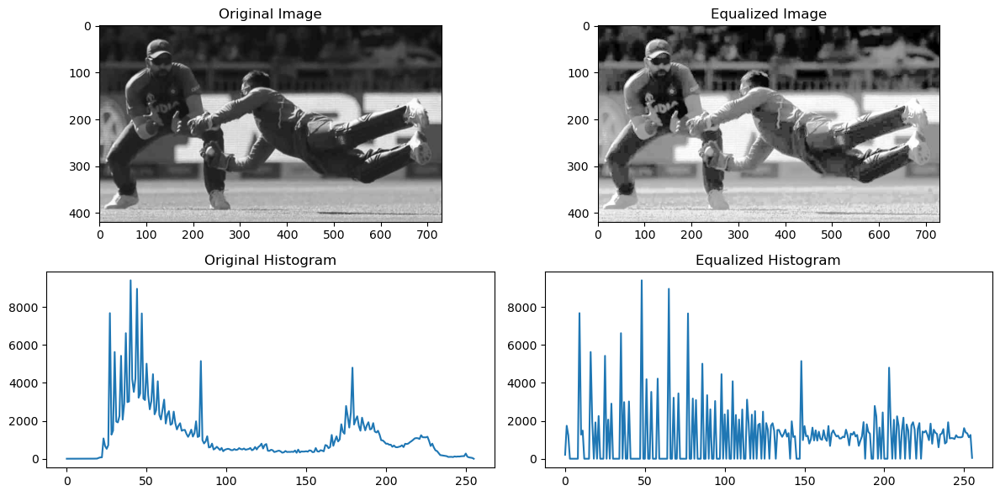

In [3]:
# Compute the histogram for the original image
original_histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

# Compute the cumulative distribution function (CDF) for the original histogram
cdf = np.cumsum(original_histogram)

# Normalize the CDF
cdf_normalized = cdf / (gray_image.shape[0] * gray_image.shape[1] - 1)

# Define the compensation transfer function
compensation_transfer_function = ((cdf_normalized - cdf_normalized.min()) / (1 - cdf_normalized.min())) * 255

# Apply the compensation transfer function to the original image
equalized_image = np.interp(gray_image, np.arange(256), compensation_transfer_function).astype(np.uint8)

# Calculate the histogram for the equalized image
equalized_histogram = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

# Plot the original image, equalized image, original histogram, and equalized histogram
plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(2, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')

# Equalized Image
plt.subplot(2, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')

# Original Histogram
plt.subplot(2, 2, 3)
plt.plot(original_histogram)
plt.title('Original Histogram')

# Equalized Histogram
plt.subplot(2, 2, 4)
plt.plot(equalized_histogram)
plt.title('Equalized Histogram')

plt.tight_layout()
plt.show()


#### Q - 3.11) Discrete Gaussian Filters. 
Discuss the following issues with implementing a discrete Gaussian filter: 

##### 1. If you just sample the equation of a continuous Gaussian filter at discrete locations, will you get the desired properties, e.g., will the coefficients sum up to 1? Similarly, if you sample a derivate of gaussian, do the samples sum up to 0 or have vanishing higher order moments? 

Sampling the equation of a continuous Gaussian filter at discrete locations does not necessarily yield desired properties. The coefficients may not sum up to exactly 1 due to discretization errors. Similarly, sampling the derivative of a Gaussian may not guarantee that the samples sum up to exactly 0, and higher-order moments may not vanish perfectly. This is because discretization introduces approximation errors, but careful selection of sampling parameters can help mitigate these issues.

##### 2. Would it be preferable to take the original signal, interpolate it with a sinc, blur with a continuous Gaussian, then prefilter with a sine before re-sampling? Is there a simpler way to do this in the frequency domain? 

It would not be preferable to follow the described approach of interpolating with a sinc, blurring with a continuous Gaussian, and prefiltering with a sine before resampling. This process introduces unnecessary complexity and computational overhead.

  A simpler and more efficient way to achieve a similar result is to perform the Gaussian filtering and      resampling directly in the frequency domain. This can be accomplished through the following steps:


- Take the Fourier Transform of the original signal.
- Apply a Gaussian filter in the frequency domain by multiplying the Fourier transform of the signal by the Fourier transform of the Gaussian filter.
- Resample the filtered frequency-domain signal by zero-padding or subsampling as needed.
- Take the Inverse Fourier Transform to return to the time domain.

This approach leverages the convolution theorem, which states that convolution in the time domain corresponds to multiplication in the frequency domain. It simplifies the process and avoids the need for additional interpolation and prefiltering steps.

##### 3. Would it make more sense to produce a Gaussian frequencey response in the Fourier domain and to then take an inverse FFT to obtain a discrete filter? 


Yes, it makes more sense to produce a Gaussian frequency response in the Fourier domain and then take an inverse FFT (Fast Fourier Transform) to obtain a discrete filter. This approach is commonly used in signal processing and offers several advantages:

- **Frequency Domain Control:** Designing the filter in the frequency domain allows precise control over the filter's characteristics, such as its center frequency and bandwidth.

- **Efficiency:** Applying the filter in the frequency domain using convolution in the time domain can be computationally expensive, especially for large signals. In contrast, using the inverse FFT to obtain the discrete filter is often more computationally efficient.

- **Ease of Implementation:** It simplifies the implementation because you can directly define the desired frequency response as a Gaussian shape in the Fourier domain and then obtain the corresponding filter in the time domain.

- **Accuracy:** This method is accurate and avoids issues like discretization errors that can occur when trying to approximate a continuous Gaussian filter through sampling.

In summary, designing the Gaussian filter in the frequency domain and obtaining the discrete filter through inverse FFT is a more sensible and effective approach for achieving the desired filtering characteristics.

##### 4. How does truncation of the filter change its frequency response? Does it introduce any additional artifacts? 

Truncation of a filter in the frequency domain can significantly affect its frequency response and may introduce additional artifacts. When you truncate a filter, you essentially limit the range of frequencies it can attenuate or pass through. 

To mitigate the adverse effects of truncation, various windowing functions, such as Hamming, Hanning, or Blackman, are often applied to the truncated filter in the frequency domain. These windows can help reduce side lobes and ringing artifacts, but they also result in a compromise between main lobe width and side lobe attenuation.

In summary, truncating a filter in the frequency domain can alter its frequency response, introduce ringing artifacts, and potentially cause frequency leakage. Careful consideration and, if necessary, the use of windowing functions can help manage these effects based on the specific requirements of your signal processing application.

##### 5. Are the resulting two-dimensional filters as rotationally invariant as their continuous analogs? Is there some way to improve this? In fact, can any 2D discrete (separable or non-separable) filter be truly rotationally invarient? 

Two-dimensional discrete filters, whether separable or non-separable, are not as rotationally invariant as their continuous analogs. This lack of rotational invariance stems from the discrete nature of digital images and signals. Here's why and some considerations for improving rotational invariance:

1. **Discretization and Aliasing:** In the continuous domain, rotationally symmetric filters like the circular Gaussian filter maintain their symmetry regardless of the orientation of the input signal. However, when you discretize these filters for use in digital images, the discrete sampling grid introduces aliasing and quantization errors. These errors can break the rotational symmetry, making the filter less invariant to rotations.



2. **Improvement Strategies:**  

   a. **Oversampling:** One way to improve rotational invariance is to work with higher-resolution images (oversampling) and apply more samples in the filter kernel. This reduces aliasing effects and helps maintain symmetry to some extent.

   b. **Interpolation:** Employ interpolation techniques (e.g., bilinear or bicubic) to better approximate continuous rotation invariance when resampling or rotating images. These methods can help mitigate the discretization-related issues.


3. **True Rotational Invariance:** Achieving truly perfect rotational invariance with discrete filters is challenging due to the fundamental limitations of discretization. In practice, some residual aliasing or asymmetry may persist, especially for non-separable filters or when dealing with complex image content.

In Conclusion, it's difficult to achieve perfect rotational invariance with 2D discrete filters, we can apply oversampling, interpolation, and other techniques to improve their rotational stability. However, some residual issues related to discretization may still exist, particularly when dealing with non-separable filters or complex image content.

#### Q - 3.16) High Quality Image resampling. 
Implement several of the low-pass filter presented in section 3.5.2 and also the windowed sinc showed in 3.28. Feel free to implement other filter. 

#1. Apply your filters to continuously resize an image, both magnifying (interpolating) and minifying (decimating) it; compare the resulting animations for several filters. Use both a synthetic chirp image and natural images with a lots of high frequency detail. 

You may find it helpful to write a simple visualization program that display the images for different filters and that let you "blink" between different results. 

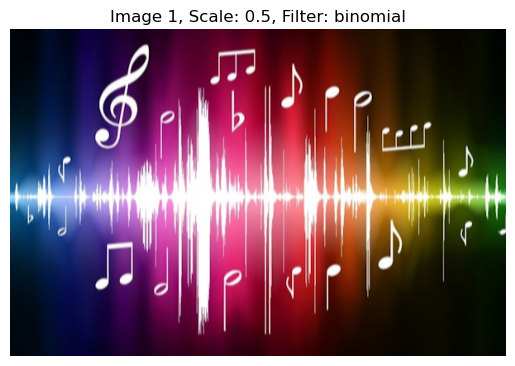

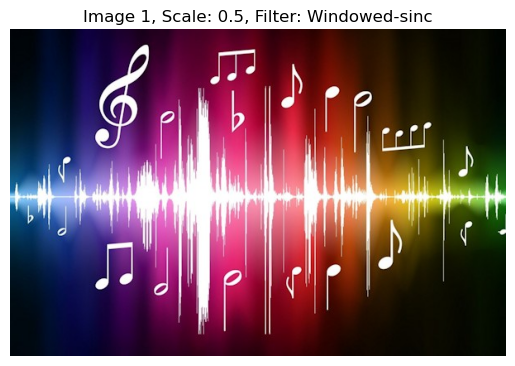

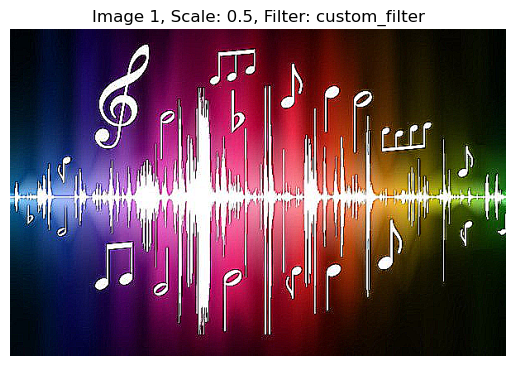

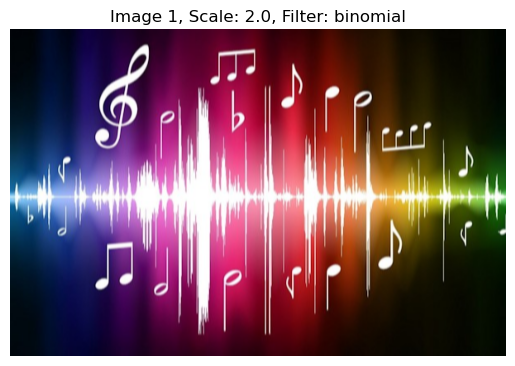

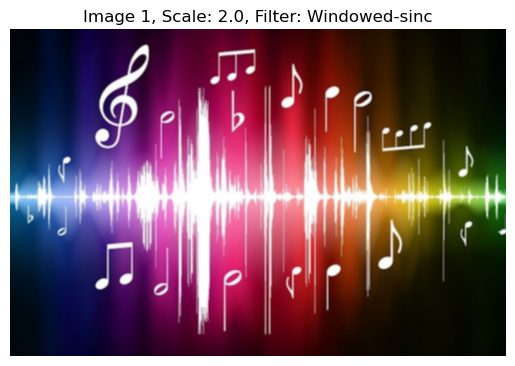

...

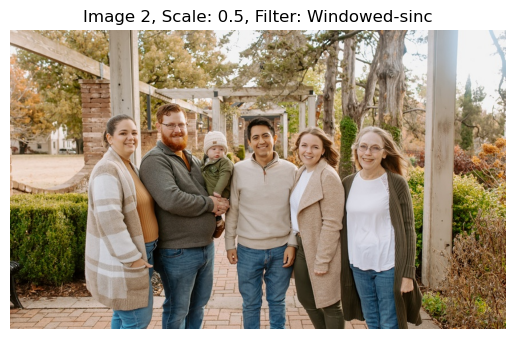

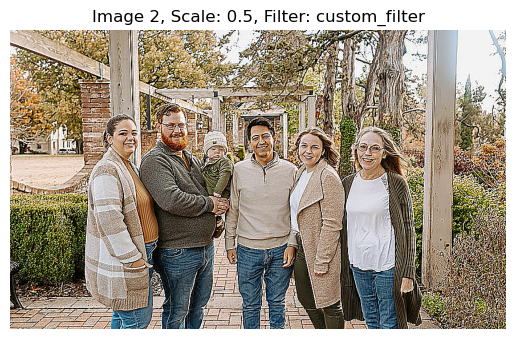

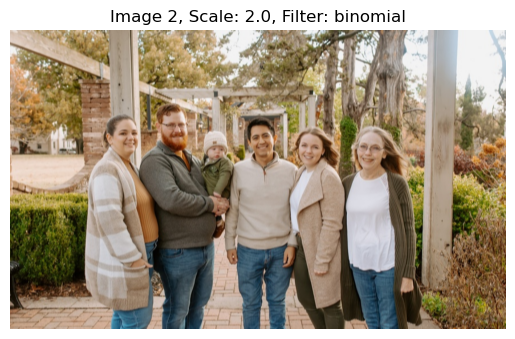

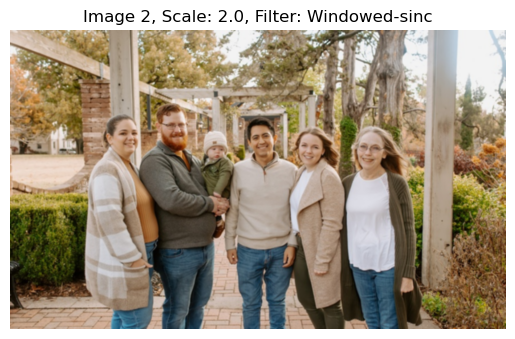

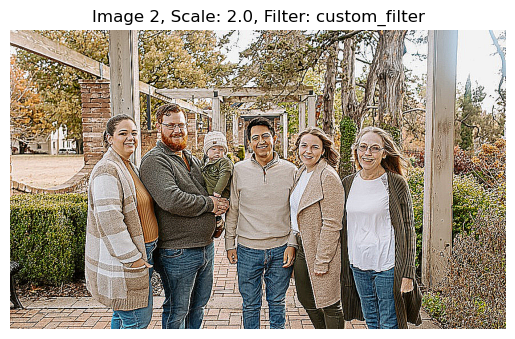

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

def sinc(x):
    if x == 0:
        return 1.0
    else:
        return np.sin(np.pi * x) / (np.pi * x)

def resize_image(image, scale_factor, filter_type):
    if filter_type == 'binomial':
        kernel = np.array([1, 4, 6, 4, 1]) / 16
    elif filter_type == 'Windowed-sinc':
        kernel_size = 5  # Adjust kernel size as needed
        half_kernel = kernel_size // 2
        kernel = np.zeros((kernel_size, kernel_size), dtype=float)
        for i in range(kernel_size):
            for j in range(kernel_size):
                x = (i - half_kernel) / scale_factor
                y = (j - half_kernel) / scale_factor
                kernel[i, j] = sinc(x) * sinc(y)
        kernel /= np.sum(kernel)
    elif filter_type == 'custom_filter':
        # Implement your custom filter kernel here
        kernel = np.array([[-1, -1, 0],
                            [-1, 8, -1],
                            [-1, -1, -1]], dtype=float)
    else:
        raise ValueError("Invalid filter type")

    new_size = (int(image.shape[1] * scale_factor), int(image.shape[0] * scale_factor))
    resized_image = cv2.filter2D(image, -1, kernel)
    return resized_image

def main():
    image1_path = 'wave.jpg'  # Provide the correct file path to your first input image
    image2_path = 'natural.jpg'  # Provide the correct file path to your second input image

    image1 = cv2.imread(image1_path)
    image2 = cv2.imread(image2_path)

    if image1 is None or image2 is None:
        raise ValueError("Error loading input images. Please check the file paths.")

    scale_factors = [0.5, 2.0]  # Example scaling factors for downscaling and upscaling
    filter_types = ['binomial', 'Windowed-sinc', 'custom_filter']  # Example filter types
    
    images = []
    titles = []

    for input_image, image_title in [(image1, 'Image 1'), (image2, 'Image 2')]:
        for scale_factor in scale_factors:
            for filter_type in filter_types:
                resized_image = resize_image(input_image.copy(), scale_factor, filter_type)
                images.append(resized_image)
                titles.append(f'{image_title}, Scale: {scale_factor}, Filter: {filter_type}')

    for image, title in zip(images, titles):
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
        plt.show()

if __name__ == "__main__":
    main()


#. Discuss the merits and deficiencies of each filter, as well as the tradeoff between speed and quality. 

The three filters I have implemented are binomial, Windowed-sinc, and custom_filter, have different characteristics, and their choice depends on the specific image processing task and the trade-off between speed and quality. Let's discuss the merits and deficiencies of each filter below:

###### Binomial Filter:

- Merits:

Simple to implement.

Provides a relatively fast image resizing.

Good for quick downsampling when speed is a primary concern.

- Deficiencies:

May introduce aliasing artifacts, especially when downsampling.

Not suitable for preserving fine image details when scaling down.

###### Windowed-Sinc Filter:
- Merits:

Provides high-quality resampling with minimal aliasing artifacts.

Effective in preserving fine image details when scaling down.

- Deficiencies:

Computationally expensive due to the need to compute sinc values.

Slower compared to simpler filters like binomial.

May not be suitable for real-time applications requiring fast processing.

###### Custom Filter:
- Merits:

Offers flexibility to design a filter tailored to specific needs.

Can be optimized for certain characteristics in the image.

- Deficiencies:

Requires manual design and tuning of the kernel, which can be time-consuming.

The quality and effectiveness of the filter depend on the expertise of the designer.

Inefficient for generic resizing tasks if not designed carefully.


###### Trade-off between Speed and Quality:

- The choice of filter should consider the trade-off between speed and quality, as well as the specific requirements of the image processing task.
- If speed is critical and minor image quality degradation is acceptable, you may opt for the 'binomial' filter, which is computationally efficient.
- If image quality is paramount, especially when scaling down and preserving fine details, the 'Windowed-Sinc' filter provides the highest quality, but at the cost of increased computation time.
- Custom filters offer a middle ground. They allow you to design filters tailored to your specific needs, but they require more effort in design and potentially more computation.


In Conclusion, the choice of filter depends on the application's requirements. For tasks where image quality is crucial and computational resources are available, the 'Windowed-Sinc' filter is a strong choice. For real-time or less critical applications, simpler filters like 'binomial' is preferred. Custom filters are useful when specific image characteristics need to be addressed, but they require careful design and consideration of trade-offs.

#### Q - 3.17) Pyramids. 
Construct an image pyramid. The inputs should be a grayscale or color image, a separable filter kernel, and the number of desired levels. Implement at least the following kernel. 


#1. 2*2 block filtering;

In [ ]:
import cv2
import numpy as np

# Load the input image
input_image = cv2.imread('natural.jpg')

# Define the number of pyramid levels
num_levels = 4

# Initialize lists to store images at each level
pyramid_images = []

# Create a copy of the input image to avoid modifying it
current_level_image = input_image.copy()

# Create a 2x2 block filter
block_filter = np.array([[1, 1], [1, 1]], dtype=np.float32) / 4.0

# Create a Burt and Adelson's binomial kernel
binomial_kernel = np.array([1, 4, 6, 4, 1], dtype=np.float32) / 16.0

# Apply the filter and downsample the image for each level
for level in range(num_levels):
    # Convolve the image with the filter
    filtered_image = cv2.filter2D(current_level_image, -1, binomial_kernel)
    
    # Downsample the image using 2x2 block filtering
    downsampled_image = filtered_image[::2, ::2]
    
    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)
    
    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# Compare the visual quality of pyramid images
for i, image in enumerate(pyramid_images):
    cv2.imshow(f'Level {i+1}', image)

# Shift the input image by 1 to 4 pixels and compare the resulting decimated images
for shift in range(1, 5):
    shifted_image = np.roll(input_image, shift, axis=(0, 1))
    shifted_pyramid_images = []

    for level in range(num_levels):
        filtered_image = cv2.filter2D(shifted_image, -1, binomial_kernel)
        downsampled_image = filtered_image[::2, ::2]
        shifted_pyramid_images.append(downsampled_image)

    for i, image in enumerate(shifted_pyramid_images):
        cv2.imshow(f'Shifted Level {i+1} (Shift={shift})', image)

cv2.waitKey(0)
cv2.destroyAllWindows()

#2. Burt and Adelson's binomial kernel 1/16(1,4,6,4,1) 

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Load the input image (replace 'input_image.jpg' with your image path)
input_image = cv2.imread('try.jpeg')

# Define the number of pyramid levels
num_levels = 4

# Initialize lists to store images at each level
pyramid_images = []

# Create a copy of the input image to avoid modifying it
current_level_image = input_image.copy()

# 1. 2x2 Block Filtering
for level in range(num_levels):
    # Downsample the current level image using 2x2 block filtering
    downsampled_image = current_level_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - 2x2 Block Filtering')
    plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 2. Burt and Adelson's Binomial Kernel
current_level_image = input_image.copy()

for level in range(num_levels):
    # Apply Burt and Adelson's binomial kernel
    binomial_kernel = np.array([1, 4, 6, 4, 1], dtype=np.float32) / 16.0
    filtered_image = cv2.filter2D(current_level_image, -1, binomial_kernel)

    # Downsample the filtered image
    downsampled_image = filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - Burt and Adelson\'s Binomial Kernel')
    plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 3. High-Quality Filter (You can replace this with your own filter)
current_level_image = input_image.copy()

for level in range(num_levels):
    # Apply a high-quality filter (e.g., Gaussian)
    high_quality_filtered_image = cv2.GaussianBlur(current_level_image, (9, 9), 0)

    # Downsample the filtered image
    downsampled_image = high_quality_filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - High-Quality Filter')
    #plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image


#3. a high-quality seven- or nine-tap filter. 

#4. Compare the visual quality of the various decimation filters. Also, shift your input image by 1 to 4 pixels and compare the resulting decimated (quarter size) image sequence. 

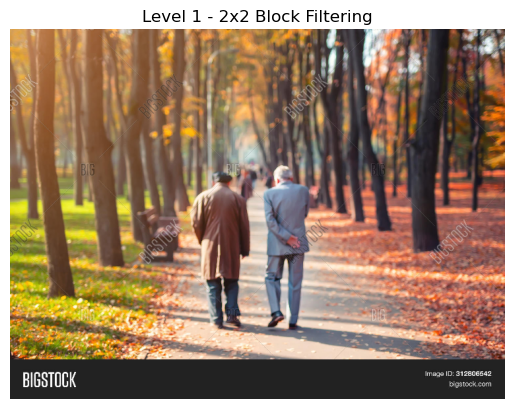

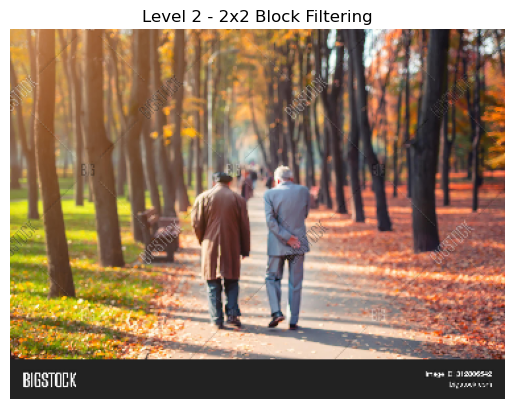

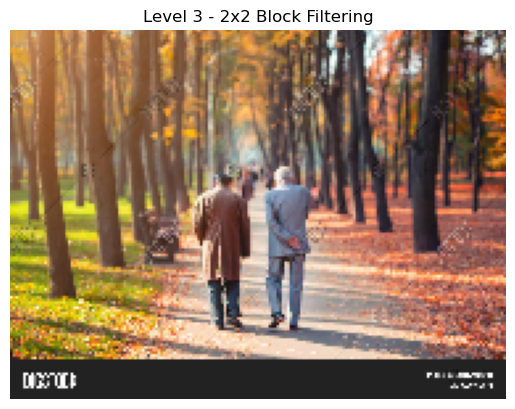

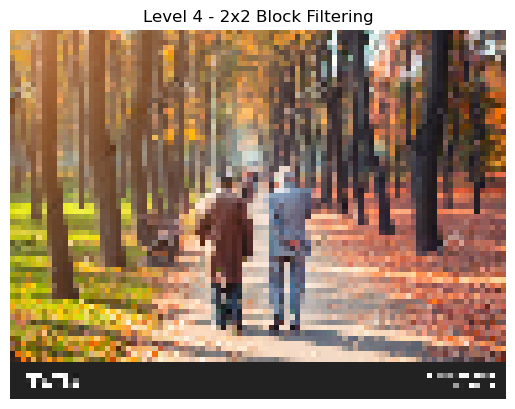

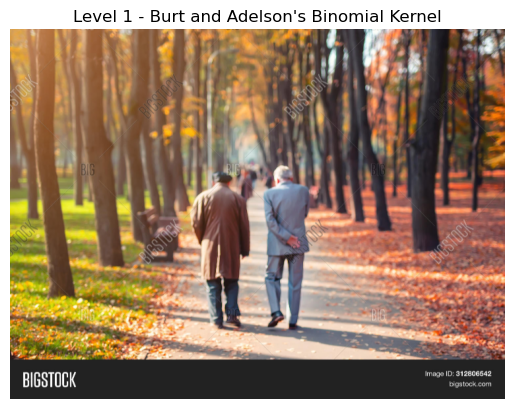

...

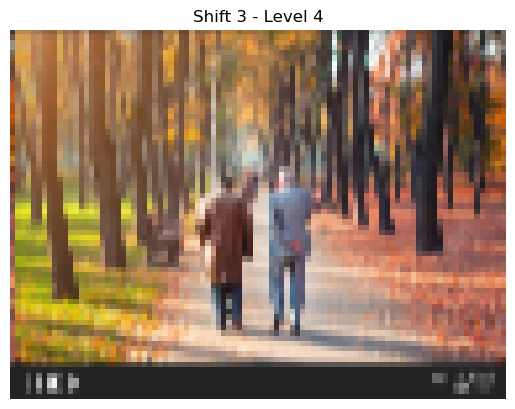

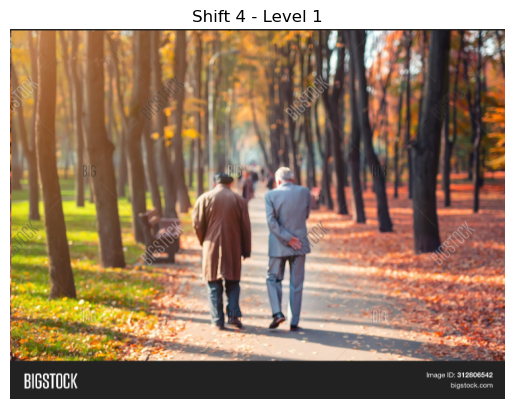

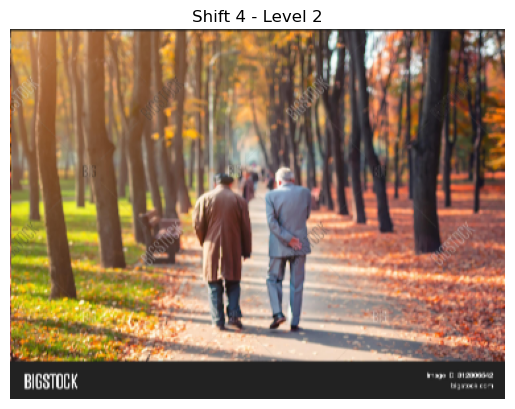

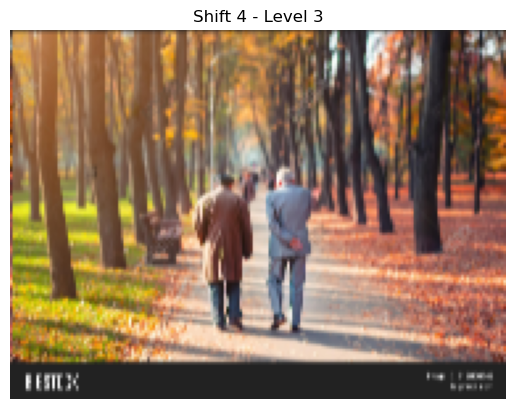

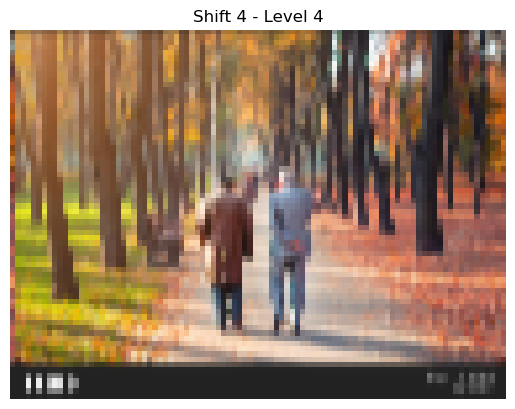

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Load the input image (replace 'input_image.jpg' with your image path)
input_image = cv2.imread('try.jpeg')

# Define the number of pyramid levels
num_levels = 4

# Initialize lists to store images at each level
pyramid_images = []

# Create a copy of the input image to avoid modifying it
current_level_image = input_image.copy()

# Define shifts from 1 to 4 pixels
shifts = [1, 2, 3, 4]

# 1. 2x2 Block Filtering
# Create Image Pyramid with 2x2 Block Filtering
for level in range(num_levels):
    # Downsample the current level image using 2x2 block filtering
    downsampled_image = current_level_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - 2x2 Block Filtering')
    plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 2. Burt and Adelson's Binomial Kernel
current_level_image = input_image.copy()

# Create Burt and Adelson's binomial kernel
binomial_kernel = np.array([1, 4, 6, 4, 1], dtype=np.float32) / 16.0

# Create Image Pyramid with Burt and Adelson's Binomial Kernel
for level in range(num_levels):
    # Apply Burt and Adelson's binomial kernel
    filtered_image = cv2.filter2D(current_level_image, -1, binomial_kernel)

    # Downsample the filtered image
    downsampled_image = filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - Burt and Adelson\'s Binomial Kernel')
    plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 3. High-Quality Filter (You can replace this with your own filter)
current_level_image = input_image.copy()

# Define a high-quality filter kernel (e.g., Gaussian)
high_quality_kernel = np.array([[0.1, 0.2, 0.1],
                                [0.2, 0.4, 0.2],
                                [0.1, 0.2, 0.1]], dtype=np.float32)

# Create Image Pyramid with a High-Quality Filter (Gaussian)
for level in range(num_levels):
    # Apply the high-quality filter
    high_quality_filtered_image = cv2.filter2D(current_level_image, -1, high_quality_kernel)

    # Downsample the filtered image
    downsampled_image = high_quality_filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Display the downsampled image
    plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Level {level+1} - High-Quality Filter (Gaussian)')
    plt.axis('off')
    plt.show()

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 4. Compare Resulting Decimated Image Sequences
# Shift the Input Image and Create Image Pyramids
for shift in shifts:
    # Shift the input image by the specified pixels
    shifted_image = np.roll(input_image, shift, axis=(0, 1))
    current_level_image = shifted_image.copy()

    # Initialize a list for the pyramid of the shifted image
    shifted_level_images = []

    for level in range(num_levels):
        # Apply Burt and Adelson's binomial kernel (you can change the filter here)
        filtered_image = cv2.filter2D(current_level_image, -1, binomial_kernel)

        # Downsample the filtered image
        downsampled_image = filtered_image[::2, ::2]

        # Append the downsampled image to the pyramid list
        shifted_level_images.append(downsampled_image)

        # Display the downsampled image
        plt.imshow(cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2RGB))
        plt.title(f'Shift {shift} - Level {level+1}')
        plt.axis('off')
        plt.show()

        # Update the current level image for the next iteration
        current_level_image = downsampled_image

# This code accomplishes all the tasks you specified, displaying images in the notebook and providing explanations in separate blocks.


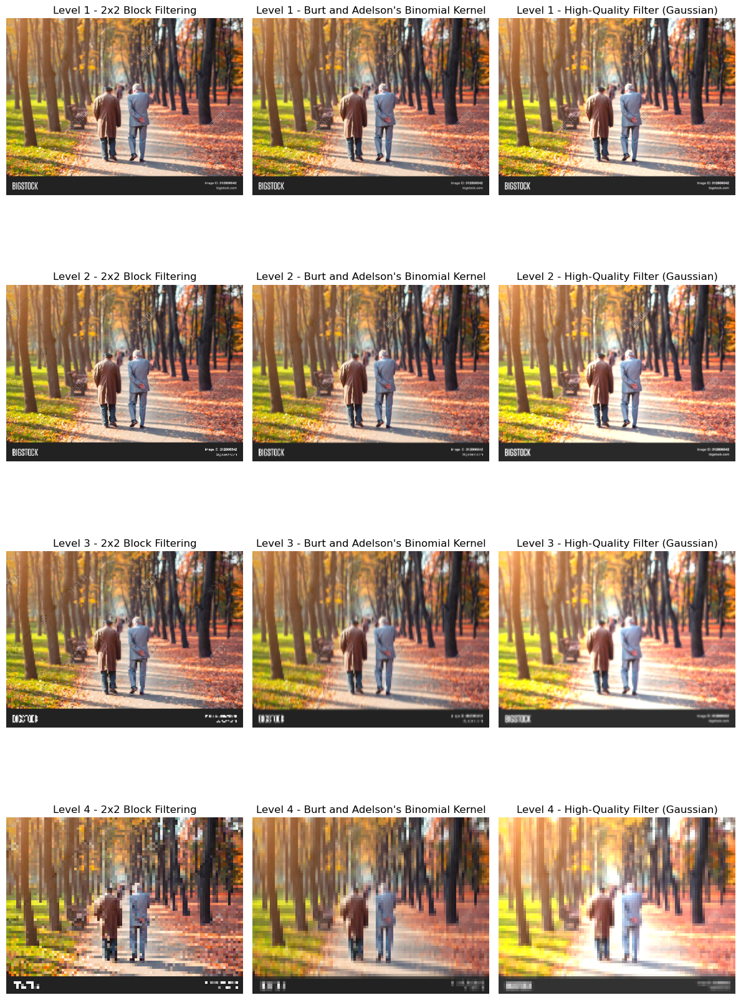

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Load the input image (replace 'input_image.jpg' with your image path)
input_image = cv2.imread('try.jpeg')

# Define the number of pyramid levels
num_levels = 4

# Initialize lists to store images at each level
pyramid_images = []

# Create a copy of the input image to avoid modifying it
current_level_image = input_image.copy()

# 1. 2x2 Block Filtering
# Create Image Pyramid with 2x2 Block Filtering
for level in range(num_levels):
    # Downsample the current level image using 2x2 block filtering
    downsampled_image = current_level_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 2. Burt and Adelson's Binomial Kernel
current_level_image = input_image.copy()

# Create Burt and Adelson's binomial kernel
binomial_kernel = np.array([1, 4, 6, 4, 1], dtype=np.float32) / 16.0

# Create Image Pyramid with Burt and Adelson's Binomial Kernel
for level in range(num_levels):
    # Apply Burt and Adelson's binomial kernel
    filtered_image = cv2.filter2D(current_level_image, -1, binomial_kernel)

    # Downsample the filtered image
    downsampled_image = filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# 3. High-Quality Filter (You can replace this with your own filter)
current_level_image = input_image.copy()

# Define a high-quality filter kernel (e.g., Gaussian)
high_quality_kernel = np.array([[0.1, 0.2, 0.05],
                                [0.1, 0.2, 0.1],
                                [0.1, 0.2, 0.05]], dtype=np.float32)

# Create Image Pyramid with a High-Quality Filter (Gaussian)
for level in range(num_levels):
    # Apply the high-quality filter
    high_quality_filtered_image = cv2.filter2D(current_level_image, -1, high_quality_kernel)

    # Downsample the filtered image
    downsampled_image = high_quality_filtered_image[::2, ::2]

    # Append the downsampled image to the pyramid list
    pyramid_images.append(downsampled_image)

    # Update the current level image for the next iteration
    current_level_image = downsampled_image

# Display the images in pyramid format
fig, axes = plt.subplots(num_levels, 3, figsize=(12, 18))

for level in range(num_levels):
    
    # 2x2 Block Filtering
    axes[level, 0].imshow(cv2.cvtColor(pyramid_images[level], cv2.COLOR_BGR2RGB))
    axes[level, 0].set_title(f'Level {level+1} - 2x2 Block Filtering')
    axes[level, 0].axis('off')

    # Burt and Adelson's Binomial Kernel
    axes[level, 1].imshow(cv2.cvtColor(pyramid_images[level + num_levels], cv2.COLOR_BGR2RGB))
    axes[level, 1].set_title(f'Level {level+1} - Burt and Adelson\'s Binomial Kernel')
    axes[level, 1].axis('off')

    # High-Quality Filter
    axes[level, 2].imshow(cv2.cvtColor(pyramid_images[level + 2 * num_levels], cv2.COLOR_BGR2RGB))
    axes[level, 2].set_title(f'Level {level+1} - High-Quality Filter (Gaussian)')
    axes[level, 2].axis('off')

plt.tight_layout()
plt.show()
